# 🎯 PROJETO FINAL — ANÁLISE DA QUALIDADE DE IMAGENS
## Implementação de Métricas Full Reference (FR-IQA)
### Impact-Lab 2025/2

---
**Como usar:**
1. Na Célula 9, coloque o caminho da sua imagem em `IMAGE_PATH`
2. Execute todas as células em ordem
3. Uma pasta `resultado_NomeDaImagem/` será criada automaticamente com tudo dentro

In [133]:
# ============================================================
# CÉLULA 1 — INSTALAÇÃO DAS DEPENDÊNCIAS
# ============================================================
# Execute apenas uma vez
# !pip install opencv-python numpy scipy matplotlib pandas scikit-image

In [134]:
!pip install opencv-python numpy scipy matplotlib pandas scikit-image

In [135]:
# ============================================================
# CÉLULA 2 — IMPORTS
# ============================================================
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.ndimage import uniform_filter
import warnings
import os
import shutil
from pathlib import Path
warnings.filterwarnings('ignore')

print('✅ Imports concluídos!')

✅ Imports concluídos!


In [136]:
# ============================================================
# CÉLULA 3 — GERENCIADOR DE PASTAS
# ============================================================

def criar_pasta_resultado(image_path):
    """
    Cria a pasta de resultado com base no nome da imagem.
    Exemplo: 'fotos/Ana.png' → pasta 'resultado_Ana/'
    """
    # Extrai o nome sem extensão
    nome_base = Path(image_path).stem  # ex: 'Ana'
    nome_pasta = f'resultado_{nome_base}'

    # Cria a pasta (apaga e recria se já existir)
    if os.path.exists(nome_pasta):
        shutil.rmtree(nome_pasta)
    os.makedirs(nome_pasta)

    # Subpastas organizadas
    for sub in ['graficos', 'visualizacoes', 'dados']:
        os.makedirs(f'{nome_pasta}/{sub}')

    print(f'📁 Pasta criada: {nome_pasta}/')
    print(f'   ├── graficos/')
    print(f'   ├── visualizacoes/')
    print(f'   └── dados/')

    return nome_pasta


def salvar_figura(fig, pasta, subfolder, filename):
    """Salva figura na subpasta correta."""
    path = f'{pasta}/{subfolder}/{filename}'
    fig.savefig(path, dpi=150, bbox_inches='tight')
    print(f'   ✅ Salvo: {path}')


print('✅ Gerenciador de pastas definido!')

✅ Gerenciador de pastas definido!


In [137]:
# ============================================================
# CÉLULA 4 — FUNÇÕES AUXILIARES
# ============================================================

def to_float(img):
    return img.astype(np.float64)


def create_test_image(size=512):
    """Cria imagem sintética para testes quando não há imagem real."""
    img = np.zeros((size, size), dtype=np.uint8)
    for i in range(size):
        img[i, :] = int(i / size * 200)
    cv2.circle(img, (150, 150), 80, 255, -1)
    cv2.circle(img, (350, 350), 60, 180, -1)
    cv2.rectangle(img, (200, 50), (350, 150), 120, -1)
    np.random.seed(42)
    for y in range(300, 480, 20):
        img[y, 50:460] = np.random.randint(50, 200, 410)
    return img


def load_or_create(path, size=512):
    """Carrega imagem em escala de cinza ou cria sintética."""
    try:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise FileNotFoundError
        img = cv2.resize(img, (size, size))
        print(f'✅ Imagem carregada: {path} → shape {img.shape}')
        return img, True
    except:
        print(f'⚠️  Arquivo não encontrado: "{path}"')
        print(f'   Usando imagem SINTÉTICA para demonstração.')
        return create_test_image(size), False


print('✅ Funções auxiliares definidas!')

✅ Funções auxiliares definidas!


In [138]:
# ============================================================
# CÉLULA 5 — MÉTRICAS CLÁSSICAS
# ============================================================

def mse(ref, dist):
    """Mean Squared Error."""
    return np.mean((to_float(ref) - to_float(dist)) ** 2)


def rmse(ref, dist):
    """Root Mean Squared Error."""
    return np.sqrt(mse(ref, dist))


def psnr(ref, dist, max_val=255.0):
    """Peak Signal-to-Noise Ratio em dB."""
    m = mse(ref, dist)
    if m == 0:
        return float('inf')
    return 10 * np.log10(max_val ** 2 / m)


def mae(ref, dist):
    """Mean Absolute Error."""
    return np.mean(np.abs(to_float(ref) - to_float(dist)))


def nae(ref, dist):
    """Normalized Absolute Error."""
    f, g = to_float(ref), to_float(dist)
    denom = np.sum(np.abs(f))
    if denom == 0:
        return 0.0
    return np.sum(np.abs(f - g)) / denom


def ncc(ref, dist):
    """Normalized Cross-Correlation."""
    f, g = to_float(ref), to_float(dist)
    num   = np.sum(f * g)
    denom = np.sqrt(np.sum(f ** 2) * np.sum(g ** 2))
    if denom == 0:
        return 0.0
    return num / denom


def fidelity(ref, dist):
    """Fidelidade: SUM(sqrt(f*g)) / SUM(f)."""
    f, g   = to_float(ref), to_float(dist)
    denom  = np.sum(f)
    if denom == 0:
        return 0.0
    return np.sum(np.sqrt(f * np.abs(g))) / denom


def accuracy(ref, dist):
    """Acurácia: 1 - NAE."""
    return 1.0 - nae(ref, dist)


print('✅ Métricas clássicas definidas!')

✅ Métricas clássicas definidas!


In [139]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.ndimage import uniform_filter
import warnings
import os
import shutil
from pathlib import Path
warnings.filterwarnings('ignore')

print('✅ Imports concluídos!')
# ============================================================
# CÉLULA 6 — MÉTRICAS PERCEPTUAIS: SSIM e MS-SSIM
# ============================================================

def ssim(ref, dist, window_size=11, C1=6.5025, C2=58.5225):
    """
    Structural Similarity Index (SSIM).
    Wang et al., 2004.
    C1 = (0.01*255)^2,  C2 = (0.03*255)^2
    """
    f  = to_float(ref)
    g  = to_float(dist)
    ux = uniform_filter(f, window_size)
    uy = uniform_filter(g, window_size)
    sx2 = np.maximum(uniform_filter(f * f, window_size) - ux ** 2, 0)
    sy2 = np.maximum(uniform_filter(g * g, window_size) - uy ** 2, 0)
    sxy = uniform_filter(f * g, window_size) - ux * uy
    num = (2 * ux * uy + C1) * (2 * sxy + C2)
    den = (ux ** 2 + uy ** 2 + C1) * (sx2 + sy2 + C2)
    return float(np.mean(num / den))


def ms_ssim(ref, dist, levels=5, weights=None):
    """
    Multi-Scale SSIM.
    Wang, Simoncelli & Bovik, 2003.
    """
    if weights is None:
        weights = [0.0448, 0.2856, 0.3001, 0.2363, 0.1333]
    f = to_float(ref)
    g = to_float(dist)
    vals = []
    for i in range(levels):
        vals.append(ssim(f.astype(np.uint8), g.astype(np.uint8)) ** weights[i])
        h, w = f.shape
        if h < 4 or w < 4:
            break
        # Fix: Replace cv2.INTER_AVERAGE with cv2.INTER_AREA
        f = cv2.resize(f, (w // 2, h // 2), interpolation=cv2.INTER_AREA)
        g = cv2.resize(g, (w // 2, h // 2), interpolation=cv2.INTER_AREA)
    return float(np.prod(vals))


print('✅ SSIM e MS-SSIM definidos!')

✅ Imports concluídos!
✅ SSIM e MS-SSIM definidos!


In [140]:
# ============================================================
# CÉLULA 7 — MÉTRICAS EXTRAS: UIQ, FSIM, VIF
# ============================================================

# ----------------------------------------------------------
# UIQ — Universal Image Quality Index
# Wang & Bovik, 2002. IEEE Signal Processing Letters.
# ----------------------------------------------------------
def uiq(ref, dist, window_size=8):
    """
    Universal Image Quality Index (UIQ).
    Q = (4 * sigma_fg * mean_f * mean_g) /
        ((sigma_f^2 + sigma_g^2) * (mean_f^2 + mean_g^2))
    Combina perda de correlação, distorção de luminância
    e distorção de contraste. Varia de -1 a 1.
    """
    f  = to_float(ref)
    g  = to_float(dist)
    uf = uniform_filter(f, window_size)
    ug = uniform_filter(g, window_size)
    uf2 = uniform_filter(f * f, window_size)
    ug2 = uniform_filter(g * g, window_size)
    ufg = uniform_filter(f * g, window_size)
    sf2 = uf2 - uf ** 2
    sg2 = ug2 - ug ** 2
    sfg = ufg - uf * ug
    denom = (sf2 + sg2) * (uf ** 2 + ug ** 2)
    mask  = denom != 0
    Q_map = np.zeros_like(f)
    Q_map[mask] = (4 * sfg[mask] * uf[mask] * ug[mask]) / denom[mask]
    return float(np.mean(Q_map))


# ----------------------------------------------------------
# FSIM — Feature Similarity Index
# Zhang et al., 2011. IEEE Trans. on Image Processing.
# ----------------------------------------------------------
def _phase_congruency(img, nscale=4, minWaveLength=6, mult=2.0,
                       sigmaOnf=0.55, k=2.0, epsilon=0.0001):
    """Phase Congruency simplificado via filtros Log-Gabor."""
    rows, cols = img.shape
    img_norm   = img.astype(np.float64)
    if img_norm.max() > 1.0:
        img_norm = img_norm / 255.0
    IM = np.fft.fft2(img_norm)
    u1, u2 = np.meshgrid(
        np.arange(-cols // 2, cols // 2) / cols,
        np.arange(-rows // 2, rows // 2) / rows
    )
    radius = np.sqrt(u1 ** 2 + u2 ** 2)
    radius[rows // 2, cols // 2] = 1
    radius = np.fft.ifftshift(radius)
    totalEnergy = np.zeros((rows, cols))
    totalSumAn  = np.zeros((rows, cols))
    wavelength  = minWaveLength
    for _ in range(nscale):
        fo        = 1.0 / wavelength
        log_Gabor = np.exp(-(np.log(radius / fo)) ** 2 /
                           (2 * np.log(sigmaOnf) ** 2))
        log_Gabor[0, 0] = 0
        EO = np.fft.ifft2(IM * log_Gabor)
        totalEnergy += np.real(EO)
        totalSumAn  += np.abs(EO)
        wavelength  *= mult
    T  = k * np.mean(totalSumAn) + epsilon
    PC = np.maximum(totalEnergy - T, 0) / (totalSumAn + epsilon)
    return PC


def _gradient_magnitude(img):
    """Magnitude do gradiente via Sobel."""
    f  = img.astype(np.float64)
    gx = cv2.Sobel(f, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(f, cv2.CV_64F, 0, 1, ksize=3)
    return np.sqrt(gx ** 2 + gy ** 2)


def fsim(ref, dist, T1=0.85, T2=160.0):
    """
    Feature Similarity Index (FSIM).
    Combina Phase Congruency e Gradient Magnitude:
      S_PC  = (2*PC1*PC2 + T1) / (PC1^2 + PC2^2 + T1)
      S_GM  = (2*GM1*GM2 + T2) / (GM1^2 + GM2^2 + T2)
      FSIM  = SUM[S_L * PC_m] / SUM[PC_m]
    Varia de 0 a 1.
    """
    PC1 = _phase_congruency(ref)
    PC2 = _phase_congruency(dist)
    GM1 = _gradient_magnitude(ref)
    GM2 = _gradient_magnitude(dist)
    S_PC = (2 * PC1 * PC2 + T1) / (PC1 ** 2 + PC2 ** 2 + T1 + 1e-8)
    S_GM = (2 * GM1 * GM2 + T2) / (GM1 ** 2 + GM2 ** 2 + T2 + 1e-8)
    S_L  = S_PC * S_GM
    PC_m = np.maximum(PC1, PC2)
    denom = np.sum(PC_m)
    if denom == 0:
        return 0.0
    return float(np.sum(S_L * PC_m) / denom)


# ----------------------------------------------------------
# VIF — Visual Information Fidelity
# Sheikh & Bovik, 2006. IEEE Trans. on Image Processing.
# ----------------------------------------------------------
def vif(ref, dist, sigma_nsq=2.0, EPS=1e-10):
    """
    Visual Information Fidelity (VIF).
    Baseada em teoria da informação:
      VIF = I(C; E | s_n) / I(C; F | s_n)
    Melhor correlação com MOS humano para desfoque e JPEG.
    """
    f = to_float(ref)
    g = to_float(dist)
    num   = 0.0
    denom = 0.0
    for scale in range(1, 5):
        win = 2 ** scale + 1
        mu_f  = uniform_filter(f, win)
        mu_g  = uniform_filter(g, win)
        mu_f2 = uniform_filter(f * f, win)
        mu_g2 = uniform_filter(g * g, win)
        mu_fg = uniform_filter(f * g, win)
        sig_f2 = np.maximum(mu_f2 - mu_f ** 2, 0)
        sig_g2 = np.maximum(mu_g2 - mu_g ** 2, 0)
        sig_fg = mu_fg - mu_f * mu_g
        g_loc  = sig_fg / (sig_f2 + EPS)
        sig_v2 = np.maximum(sig_g2 - g_loc * sig_fg, 0)
        num   += np.sum(np.log2(1.0 + g_loc ** 2 * sig_f2 / (sig_v2 + sigma_nsq) + EPS))
        denom += np.sum(np.log2(1.0 + sig_f2 / sigma_nsq + EPS))
        h, w = f.shape
        if h < 8 or w < 8:
            break
        f = cv2.resize(f, (w // 2, h // 2), interpolation=cv2.INTER_AREA)
        g = cv2.resize(g, (w // 2, h // 2), interpolation=cv2.INTER_AREA)
    if denom == 0:
        return 0.0
    return float(num / (denom + EPS))


print('✅ UIQ, FSIM e VIF definidos!')

✅ UIQ, FSIM e VIF definidos!


In [141]:
# ============================================================
# CÉLULA 8 — COMPUTE_ALL + DISTORÇÕES
# ============================================================

def compute_all(ref, dist, include_extra=True, verbose=True):
    """Calcula todas as métricas FR implementadas."""
    results = {
        'MSE'      : mse(ref, dist),
        'RMSE'     : rmse(ref, dist),
        'PSNR'     : psnr(ref, dist),
        'MAE'      : mae(ref, dist),
        'NAE'      : nae(ref, dist),
        'NCC'      : ncc(ref, dist),
        'Fidelity' : fidelity(ref, dist),
        'Accuracy' : accuracy(ref, dist),
        'SSIM'     : ssim(ref, dist),
        'MS-SSIM'  : ms_ssim(ref, dist),
    }
    if include_extra:
        if verbose: print('     UIQ...', end=' ')
        results['UIQ']  = uiq(ref, dist)
        if verbose: print('FSIM...', end=' ')
        results['FSIM'] = fsim(ref, dist)
        if verbose: print('VIF...', end=' ')
        results['VIF']  = vif(ref, dist)
        if verbose: print('✓')
    return results


# --- DISTORÇÕES ---
def apply_gaussian_noise(img, sigma=25):
    noise = np.random.normal(0, sigma, img.shape)
    return np.clip(img.astype(float) + noise, 0, 255).astype(np.uint8)

def apply_salt_pepper(img, density=0.05):
    out = img.copy()
    n   = int(density * img.size)
    ys  = np.random.randint(0, img.shape[0], n)
    xs  = np.random.randint(0, img.shape[1], n)
    out[ys, xs] = 255
    ys  = np.random.randint(0, img.shape[0], n)
    xs  = np.random.randint(0, img.shape[1], n)
    out[ys, xs] = 0
    return out

def apply_gaussian_blur(img, ksize=7):
    k = ksize if ksize % 2 == 1 else ksize + 1
    return cv2.GaussianBlur(img, (k, k), 0)

def apply_jpeg_compression(img, quality=30):
    _, enc = cv2.imencode('.jpg', img, [cv2.IMWRITE_JPEG_QUALITY, quality])
    return cv2.imdecode(enc, cv2.IMREAD_GRAYSCALE)

def apply_brightness_contrast(img, alpha=1.5, beta=30):
    return np.clip(alpha * img.astype(float) + beta, 0, 255).astype(np.uint8)


print('✅ compute_all() e distorções definidos!')

✅ compute_all() e distorções definidos!


In [142]:
# ============================================================
# CÉLULA 9 — ⚙️ CONFIGURAÇÃO: COLOQUE SUA IMAGEM AQUI
# ============================================================

# ✏️ ALTERE APENAS ESTA LINHA:
IMAGE_PATH = '/content/foto Manual.jpeg'   # Ex: 'fotos/Carlos.jpg', 'imagens/Paisagem.png'

# -------------------------------------------------------
# O resto é automático — não precisa alterar nada abaixo
# -------------------------------------------------------
np.random.seed(42)  # reprodutibilidade

NOME_BASE  = Path(IMAGE_PATH).stem             # ex: 'Ana'
PASTA      = criar_pasta_resultado(IMAGE_PATH) # ex: 'resultado_Ana'

# Carrega (ou cria sintética)
ref_img, img_real = load_or_create(IMAGE_PATH)

# Salva uma cópia da imagem original na pasta de resultado
cv2.imwrite(f'{PASTA}/dados/imagem_original_{NOME_BASE}.png', ref_img)
print(f'\n📸 Imagem referência salva em: {PASTA}/dados/imagem_original_{NOME_BASE}.png')
print(f'📐 Dimensões: {ref_img.shape[1]}x{ref_img.shape[0]} px')
if not img_real:
    print('\n⚠️  ATENÇÃO: rodando com imagem SINTÉTICA.')
    print(f'   Para usar sua foto, coloque o arquivo em:')
    print(f'   → {os.path.abspath(IMAGE_PATH)}')

📁 Pasta criada: resultado_foto Manual/
   ├── graficos/
   ├── visualizacoes/
   └── dados/
✅ Imagem carregada: /content/foto Manual.jpeg → shape (512, 512)

📸 Imagem referência salva em: resultado_foto Manual/dados/imagem_original_foto Manual.png
📐 Dimensões: 512x512 px


In [143]:
# ============================================================
# CÉLULA 10 — EXECUÇÃO DOS 15 EXPERIMENTOS
# ============================================================

print('=' * 60)
print(f'EXPERIMENTOS — {NOME_BASE}')
print('=' * 60)

all_results  = []
distorted_imgs = {}  # guarda imagens distorcidas para visualização

# --- GRUPO 1: Ruído Gaussiano ---
print('\n📊 Grupo 1: Ruído Gaussiano')
for sigma in [10, 25, 50]:
    print(f'  sigma={sigma}...', end=' ')
    d = apply_gaussian_noise(ref_img, sigma)
    r = compute_all(ref_img, d)
    r['Experimento'] = f'Gauss σ={sigma}'
    r['Grupo']       = 'Ruído Gaussiano'
    all_results.append(r)
    distorted_imgs[f'Gauss σ={sigma}'] = d

# --- GRUPO 2: Ruído Sal-e-Pimenta ---
print('\n📊 Grupo 2: Ruído Sal-e-Pimenta')
for den in [0.01, 0.05, 0.10]:
    print(f'  density={den}...', end=' ')
    d = apply_salt_pepper(ref_img, den)
    r = compute_all(ref_img, d)
    r['Experimento'] = f'S&P d={den}'
    r['Grupo']       = 'Sal-e-Pimenta'
    all_results.append(r)
    distorted_imgs[f'S&P d={den}'] = d

# --- GRUPO 3: Desfoque ---
print('\n📊 Grupo 3: Desfoque Gaussiano')
for k in [3, 7, 15]:
    print(f'  ksize={k}...', end=' ')
    d = apply_gaussian_blur(ref_img, k)
    r = compute_all(ref_img, d)
    r['Experimento'] = f'Blur k={k}'
    r['Grupo']       = 'Desfoque'
    all_results.append(r)
    distorted_imgs[f'Blur k={k}'] = d

# --- GRUPO 4: JPEG ---
print('\n📊 Grupo 4: Compressão JPEG')
for q in [10, 30, 50, 90]:
    print(f'  Q={q}...', end=' ')
    d = apply_jpeg_compression(ref_img, q)
    r = compute_all(ref_img, d)
    r['Experimento'] = f'JPEG Q={q}'
    r['Grupo']       = 'JPEG'
    all_results.append(r)
    distorted_imgs[f'JPEG Q={q}'] = d

# --- GRUPO 5: Brilho/Contraste ---
print('\n📊 Grupo 5: Brilho e Contraste')
for alpha, beta, label in [(0.5, -50, 'α=0.5 β=-50'), (1.5, 50, 'α=1.5 β=+50')]:
    print(f'  {label}...', end=' ')
    d = apply_brightness_contrast(ref_img, alpha, beta)
    r = compute_all(ref_img, d)
    r['Experimento'] = f'Brilho {label}'
    r['Grupo']       = 'Brilho/Contraste'
    all_results.append(r)
    distorted_imgs[f'Brilho {label}'] = d


# --- Monta DataFrame ---
df = pd.DataFrame(all_results)
cols_order = ['Grupo','Experimento','MSE','RMSE','PSNR','MAE',
              'NAE','NCC','Fidelity','Accuracy','SSIM','MS-SSIM','UIQ','FSIM','VIF']
df = df[cols_order]

print(f'\n✅ {len(df)} experimentos concluídos!')

EXPERIMENTOS — foto Manual

📊 Grupo 1: Ruído Gaussiano
  sigma=10...      UIQ... FSIM... VIF... ✓
  sigma=25...      UIQ... FSIM... VIF... ✓
  sigma=50...      UIQ... FSIM... VIF... ✓

📊 Grupo 2: Ruído Sal-e-Pimenta
  density=0.01...      UIQ... FSIM... VIF... ✓
  density=0.05...      UIQ... FSIM... VIF... ✓
  density=0.1...      UIQ... FSIM... VIF... ✓

📊 Grupo 3: Desfoque Gaussiano
  ksize=3...      UIQ... FSIM... VIF... ✓
  ksize=7...      UIQ... FSIM... VIF... ✓
  ksize=15...      UIQ... FSIM... VIF... ✓

📊 Grupo 4: Compressão JPEG
  Q=10...      UIQ... FSIM... VIF... ✓
  Q=30...      UIQ... FSIM... VIF... ✓
  Q=50...      UIQ... FSIM... VIF... ✓
  Q=90...      UIQ... FSIM... VIF... ✓

📊 Grupo 5: Brilho e Contraste
  α=0.5 β=-50...      UIQ... FSIM... VIF... ✓
  α=1.5 β=+50...      UIQ... FSIM... VIF... ✓

✅ 15 experimentos concluídos!


In [144]:
# ============================================================
# CÉLULA 11 — SALVA TABELAS CSV E EXIBE RESULTADOS
# ============================================================

# CSV completo
csv_path = f'{PASTA}/dados/resultados_completos_{NOME_BASE}.csv'
df.to_csv(csv_path, index=False, float_format='%.6f')
print(f'💾 CSV salvo: {csv_path}')

# CSV por grupo
for grupo in df['Grupo'].unique():
    sub  = df[df['Grupo'] == grupo].drop(columns=['Grupo'])
    nome = grupo.replace('/', '_').replace(' ', '_')
    sub.to_csv(f'{PASTA}/dados/resultado_{nome}_{NOME_BASE}.csv',
               index=False, float_format='%.6f')

print(f'💾 CSVs por grupo salvos em: {PASTA}/dados/')

# Exibe tabela arredondada
df_show = df.copy()
for c in df_show.select_dtypes(include='number').columns:
    df_show[c] = df_show[c].round(4)

print('\n' + '=' * 80)
print(f'RESULTADOS COMPLETOS — {NOME_BASE}')
print('=' * 80)
print(df_show.to_string(index=False))

💾 CSV salvo: resultado_foto Manual/dados/resultados_completos_foto Manual.csv
💾 CSVs por grupo salvos em: resultado_foto Manual/dados/

RESULTADOS COMPLETOS — foto Manual
           Grupo        Experimento       MSE    RMSE    PSNR     MAE    NAE    NCC  Fidelity  Accuracy   SSIM  MS-SSIM    UIQ   FSIM    VIF
 Ruído Gaussiano         Gauss σ=10   98.6524  9.9324 28.1897  7.9028 0.0802 0.9962    0.9946    0.9198 0.6676   0.9467 0.4561 0.7453 0.3924
 Ruído Gaussiano         Gauss σ=25  579.5463 24.0738 20.4999 19.1950 0.1948 0.9780    0.9842    0.8052 0.3618   0.8282 0.2540 0.5805 0.2152
 Ruído Gaussiano         Gauss σ=50 2092.1862 45.7404 14.9248 36.3360 0.3688 0.9266    0.9637    0.6312 0.1905   0.6734 0.1359 0.4541 0.1332
   Sal-e-Pimenta         S&P d=0.01  399.4005 19.9850 22.1167  2.5209 0.0256 0.9848    0.9953    0.9744 0.5224   0.8757 0.5065 0.9124 0.7084
   Sal-e-Pimenta         S&P d=0.05 1921.9464 43.8400 15.2934 12.0937 0.1227 0.9322    0.9758    0.8773 0.2109   0.6935 0.16

   ✅ Salvo: resultado_foto Manual/graficos/01_psnr_ssim_ruido_foto Manual.png


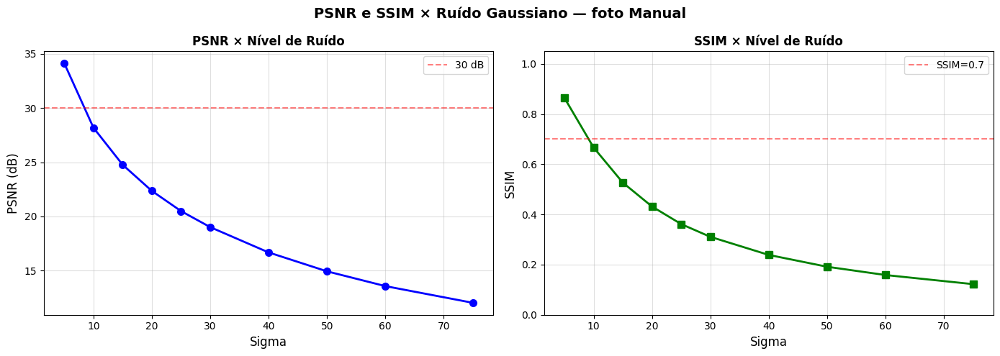

In [145]:
# ============================================================
# CÉLULA 12 — GRÁFICO 1: PSNR e SSIM × RUÍDO GAUSSIANO
# ============================================================

sigmas_plot = [5, 10, 15, 20, 25, 30, 40, 50, 60, 75]
psnrs_plot  = []
ssims_plot  = []
np.random.seed(42)
for s in sigmas_plot:
    d = apply_gaussian_noise(ref_img, s)
    psnrs_plot.append(psnr(ref_img, d))
    ssims_plot.append(ssim(ref_img, d))

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(f'PSNR e SSIM × Ruído Gaussiano — {NOME_BASE}',
             fontsize=14, fontweight='bold')

axes[0].plot(sigmas_plot, psnrs_plot, 'b-o', lw=2, ms=7)
axes[0].axhline(30, color='red', ls='--', alpha=0.5, label='30 dB')
axes[0].set_xlabel('Sigma', fontsize=12)
axes[0].set_ylabel('PSNR (dB)', fontsize=12)
axes[0].set_title('PSNR × Nível de Ruído', fontweight='bold')
axes[0].legend(); axes[0].grid(True, alpha=0.4)

axes[1].plot(sigmas_plot, ssims_plot, 'g-s', lw=2, ms=7)
axes[1].axhline(0.7, color='red', ls='--', alpha=0.5, label='SSIM=0.7')
axes[1].set_xlabel('Sigma', fontsize=12)
axes[1].set_ylabel('SSIM', fontsize=12)
axes[1].set_title('SSIM × Nível de Ruído', fontweight='bold')
axes[1].set_ylim([0, 1.05])
axes[1].legend(); axes[1].grid(True, alpha=0.4)

plt.tight_layout()
salvar_figura(fig, PASTA, 'graficos', f'01_psnr_ssim_ruido_{NOME_BASE}.png')
plt.show()

   ✅ Salvo: resultado_foto Manual/graficos/02_metricas_desfoque_foto Manual.png


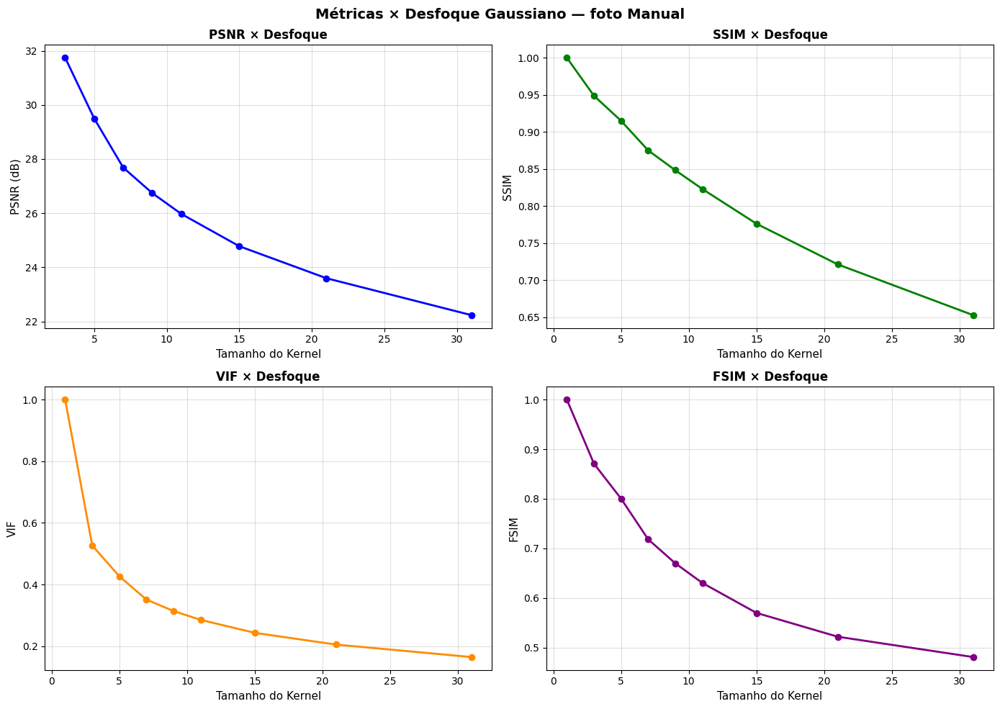

In [146]:
# ============================================================
# CÉLULA 13 — GRÁFICO 2: 4 MÉTRICAS × DESFOQUE
# ============================================================

ksizes_plot = [1, 3, 5, 7, 9, 11, 15, 21, 31]
ssims_b, psnrs_b, vifs_b, fsims_b = [], [], [], []
for k in ksizes_plot:
    d = apply_gaussian_blur(ref_img, k) if k > 1 else ref_img.copy()
    ssims_b.append(ssim(ref_img, d))
    psnrs_b.append(psnr(ref_img, d))
    vifs_b.append(vif(ref_img, d))
    fsims_b.append(fsim(ref_img, d))

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle(f'Métricas × Desfoque Gaussiano — {NOME_BASE}',
             fontsize=14, fontweight='bold')

for ax, data, color, title, ylabel in [
    (axes[0,0], psnrs_b, 'blue',       'PSNR × Desfoque',   'PSNR (dB)'),
    (axes[0,1], ssims_b, 'green',      'SSIM × Desfoque',   'SSIM'),
    (axes[1,0], vifs_b,  'darkorange', 'VIF × Desfoque',    'VIF'),
    (axes[1,1], fsims_b, 'purple',     'FSIM × Desfoque',   'FSIM'),
]:
    ax.plot(ksizes_plot, data, 'o-', color=color, lw=2, ms=6)
    ax.set_xlabel('Tamanho do Kernel', fontsize=11)
    ax.set_ylabel(ylabel, fontsize=11)
    ax.set_title(title, fontweight='bold')
    ax.grid(True, alpha=0.4)

plt.tight_layout()
salvar_figura(fig, PASTA, 'graficos', f'02_metricas_desfoque_{NOME_BASE}.png')
plt.show()

   ✅ Salvo: resultado_foto Manual/graficos/03_metricas_jpeg_foto Manual.png


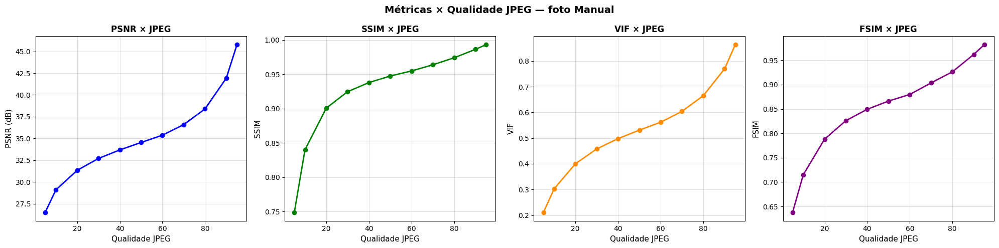

In [147]:
# ============================================================
# CÉLULA 14 — GRÁFICO 3: MÉTRICAS × QUALIDADE JPEG
# ============================================================

qualities = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 95]
ssims_j, psnrs_j, vifs_j, fsims_j = [], [], [], []
for q in qualities:
    d = apply_jpeg_compression(ref_img, q)
    ssims_j.append(ssim(ref_img, d))
    psnrs_j.append(psnr(ref_img, d))
    vifs_j.append(vif(ref_img, d))
    fsims_j.append(fsim(ref_img, d))

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle(f'Métricas × Qualidade JPEG — {NOME_BASE}',
             fontsize=14, fontweight='bold')

for ax, data, color, title, ylabel in [
    (axes[0], psnrs_j, 'blue',       'PSNR × JPEG', 'PSNR (dB)'),
    (axes[1], ssims_j, 'green',      'SSIM × JPEG', 'SSIM'),
    (axes[2], vifs_j,  'darkorange', 'VIF × JPEG',  'VIF'),
    (axes[3], fsims_j, 'purple',     'FSIM × JPEG', 'FSIM'),
]:
    ax.plot(qualities, data, 'o-', color=color, lw=2, ms=6)
    ax.set_xlabel('Qualidade JPEG', fontsize=11)
    ax.set_ylabel(ylabel, fontsize=11)
    ax.set_title(title, fontweight='bold')
    ax.grid(True, alpha=0.4)

plt.tight_layout()
salvar_figura(fig, PASTA, 'graficos', f'03_metricas_jpeg_{NOME_BASE}.png')
plt.show()

   ✅ Salvo: resultado_foto Manual/graficos/04_heatmap_metricas_foto Manual.png


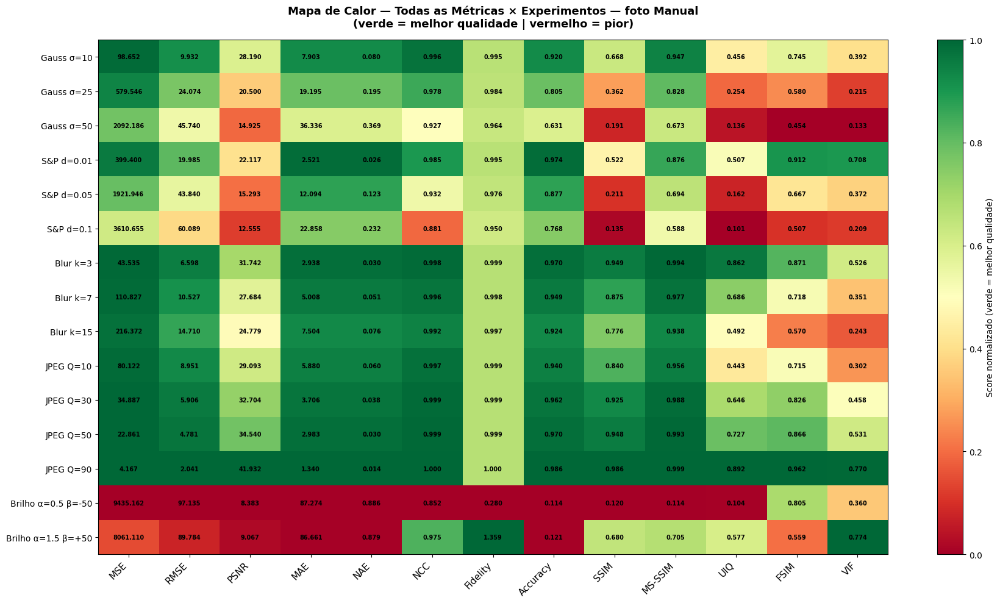

In [148]:
# ============================================================
# CÉLULA 15 — GRÁFICO 4: MAPA DE CALOR GERAL
# ============================================================

numeric_cols = ['MSE','RMSE','PSNR','MAE','NAE','NCC',
                'Fidelity','Accuracy','SSIM','MS-SSIM','UIQ','FSIM','VIF']
inverted     = ['MSE','RMSE','MAE','NAE']  # menor = melhor → inverte para verde

df_heat = df[numeric_cols].copy()
for col in numeric_cols:
    lo, hi = df_heat[col].min(), df_heat[col].max()
    rng = hi - lo
    if rng == 0:
        df_heat[col] = 0.5
    elif col in inverted:
        df_heat[col] = 1 - (df_heat[col] - lo) / rng
    else:
        df_heat[col] = (df_heat[col] - lo) / rng

fig, ax = plt.subplots(figsize=(18, 10))
im = ax.imshow(df_heat.values, cmap='RdYlGn', aspect='auto', vmin=0, vmax=1)
plt.colorbar(im, ax=ax, label='Score normalizado (verde = melhor qualidade)')

ax.set_xticks(range(len(numeric_cols)))
ax.set_xticklabels(numeric_cols, rotation=45, ha='right', fontsize=11)
ax.set_yticks(range(len(df)))
ax.set_yticklabels(df['Experimento'], fontsize=10)

for i in range(len(df)):
    for j, col in enumerate(numeric_cols):
        val = df[col].iloc[i]
        ax.text(j, i, f'{val:.3f}', ha='center', va='center',
                fontsize=7, color='black', fontweight='bold')

ax.set_title(f'Mapa de Calor — Todas as Métricas × Experimentos — {NOME_BASE}\n'
             '(verde = melhor qualidade | vermelho = pior)',
             fontsize=13, fontweight='bold', pad=15)
plt.tight_layout()
salvar_figura(fig, PASTA, 'graficos', f'04_heatmap_metricas_{NOME_BASE}.png')
plt.show()

   ✅ Salvo: resultado_foto Manual/graficos/05_correlacao_metricas_foto Manual.png


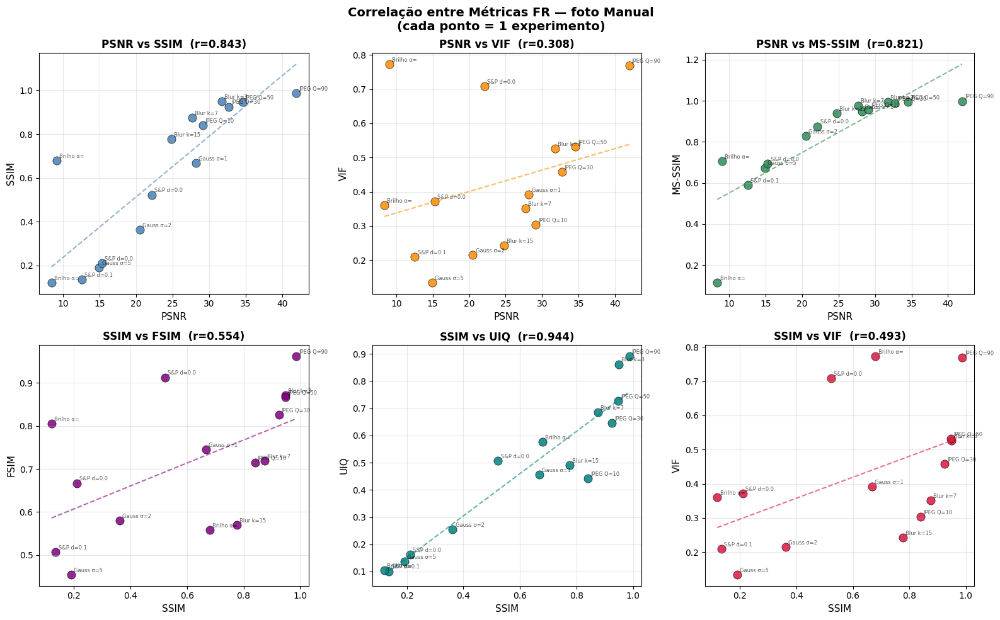

In [149]:
# ============================================================
# CÉLULA 16 — GRÁFICO 5: CORRELAÇÃO ENTRE MÉTRICAS
# ============================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle(f'Correlação entre Métricas FR — {NOME_BASE}\n'
             '(cada ponto = 1 experimento)',
             fontsize=14, fontweight='bold')

pairs = [
    ('PSNR',  'SSIM',    'steelblue',   axes[0,0]),
    ('PSNR',  'VIF',     'darkorange',  axes[0,1]),
    ('PSNR',  'MS-SSIM', 'seagreen',    axes[0,2]),
    ('SSIM',  'FSIM',    'purple',      axes[1,0]),
    ('SSIM',  'UIQ',     'teal',        axes[1,1]),
    ('SSIM',  'VIF',     'crimson',     axes[1,2]),
]

for x_col, y_col, color, ax in pairs:
    ax.scatter(df[x_col], df[y_col], color=color, s=90, alpha=0.85, edgecolors='black', lw=0.5)
    z     = np.polyfit(df[x_col], df[y_col], 1)
    p_fit = np.poly1d(z)
    xr    = np.linspace(df[x_col].min(), df[x_col].max(), 100)
    ax.plot(xr, p_fit(xr), '--', color=color, alpha=0.6, lw=1.5)
    corr  = np.corrcoef(df[x_col], df[y_col])[0, 1]
    ax.set_xlabel(x_col, fontsize=11)
    ax.set_ylabel(y_col, fontsize=11)
    ax.set_title(f'{x_col} vs {y_col}  (r={corr:.3f})', fontweight='bold')
    ax.grid(True, alpha=0.3)
    for _, row in df.iterrows():
        ax.annotate(row['Experimento'][:9], (row[x_col], row[y_col]),
                    fontsize=6, alpha=0.65, xytext=(3,3), textcoords='offset points')

plt.tight_layout()
salvar_figura(fig, PASTA, 'graficos', f'05_correlacao_metricas_{NOME_BASE}.png')
plt.show()

Gerando visualizações lado a lado...

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_01_gauss25_foto Manual.png


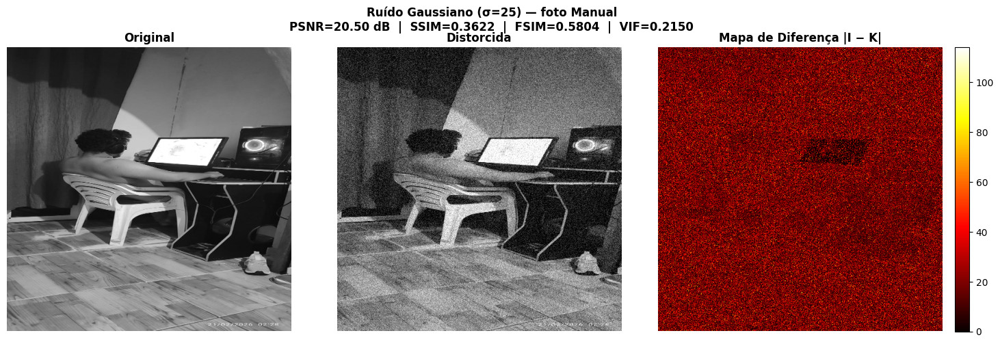

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_02_gauss50_foto Manual.png


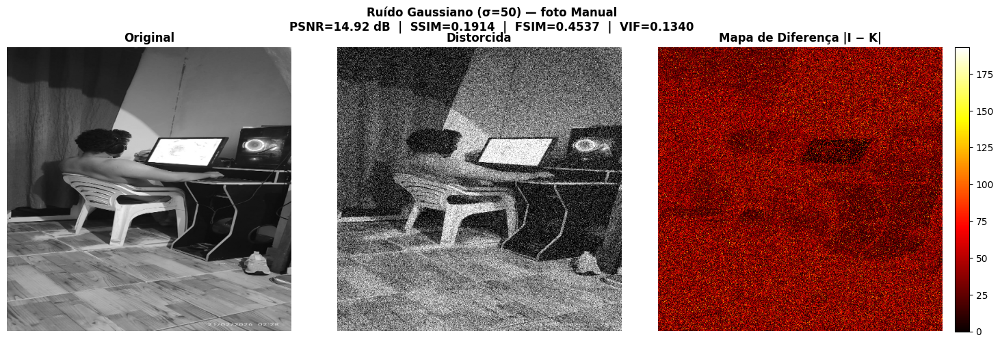

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_03_sp005_foto Manual.png


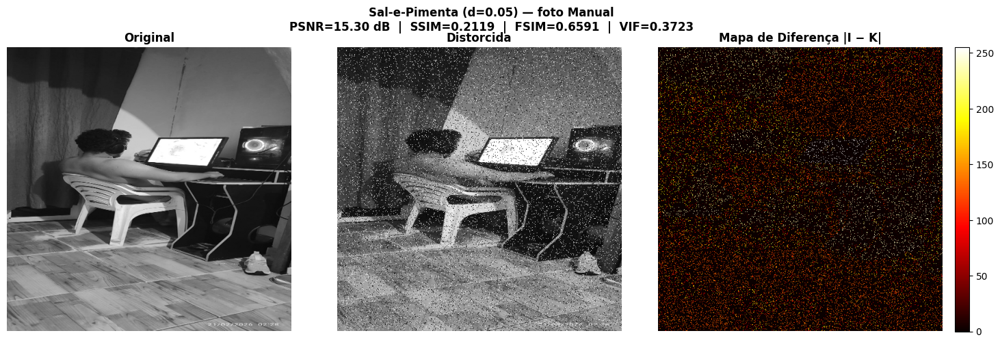

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_04_sp010_foto Manual.png


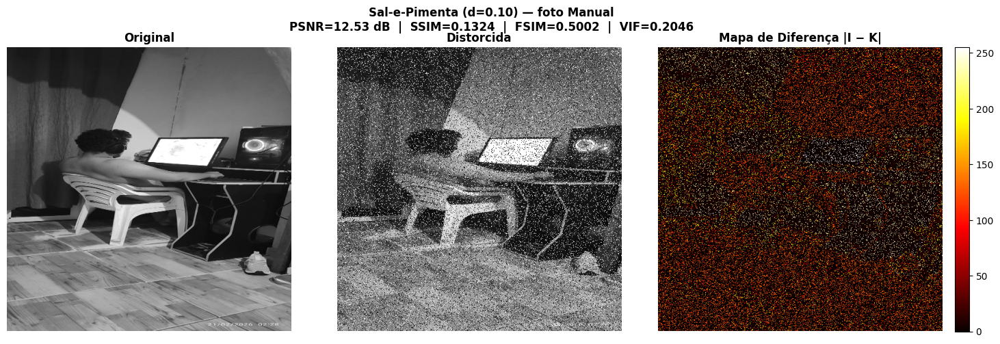

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_05_blur7_foto Manual.png


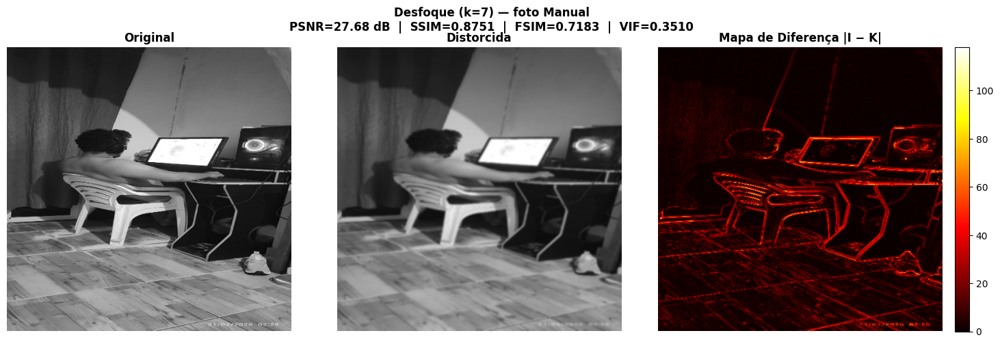

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_06_blur15_foto Manual.png


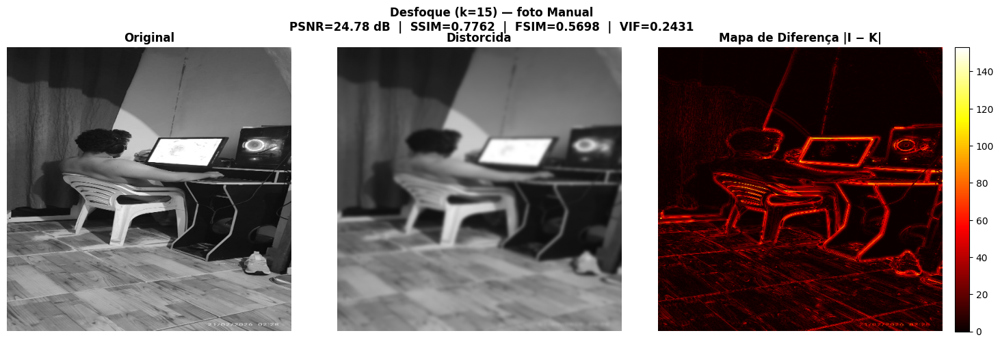

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_07_jpeg10_foto Manual.png


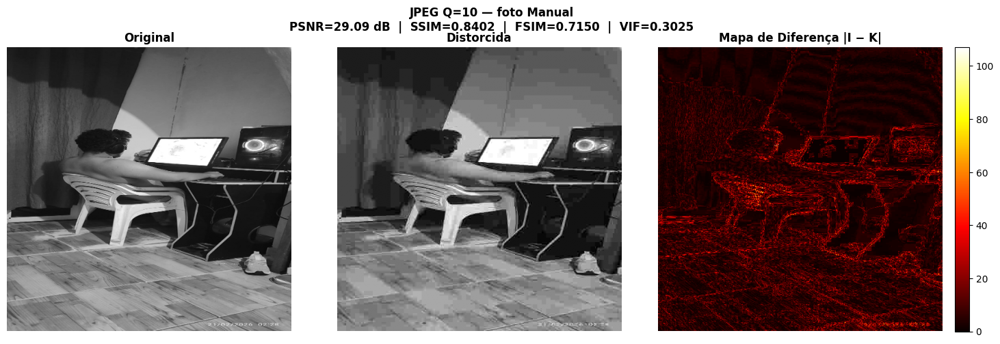

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_08_jpeg50_foto Manual.png


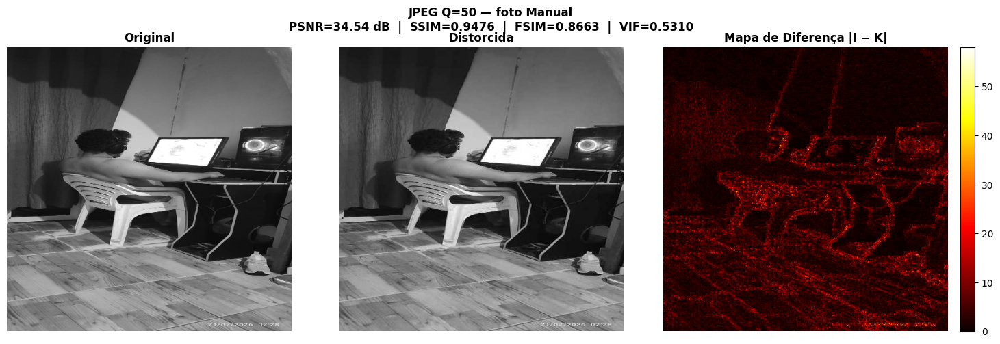

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_09_brilho_escuro_foto Manual.png


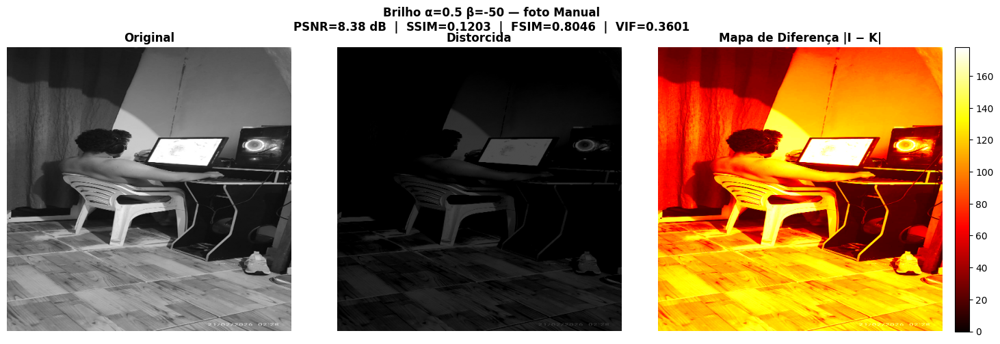

   ✅ Salvo: resultado_foto Manual/visualizacoes/viz_10_brilho_claro_foto Manual.png


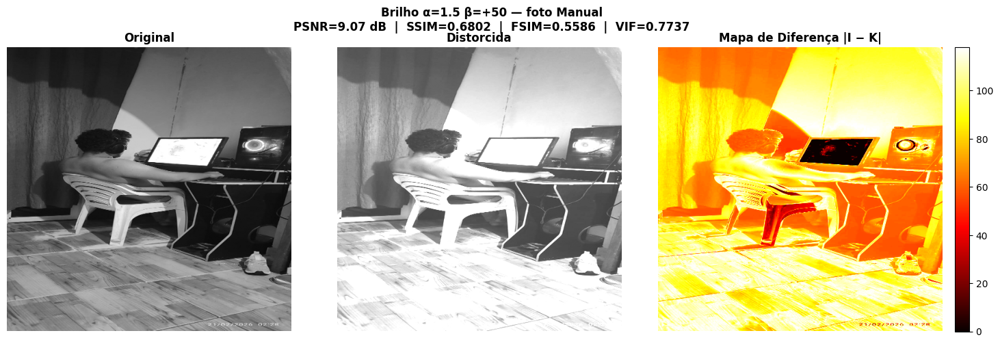

In [150]:
# ============================================================
# CÉLULA 17 — VISUALIZAÇÕES: ORIGINAL vs DISTORCIDA + MAPA
# ============================================================

def plot_triple(ref, dist, titulo, pasta, nome_arquivo):
    """Original | Distorcida | Mapa de diferença — salva na pasta."""
    diff  = np.abs(ref.astype(float) - dist.astype(float))
    p_val = psnr(ref, dist)
    s_val = ssim(ref, dist)
    f_val = fsim(ref, dist)
    v_val = vif(ref, dist)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(
        f'{titulo}\n'
        f'PSNR={p_val:.2f} dB  |  SSIM={s_val:.4f}  |  FSIM={f_val:.4f}  |  VIF={v_val:.4f}',
        fontsize=12, fontweight='bold'
    )
    axes[0].imshow(ref,  cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Original', fontweight='bold'); axes[0].axis('off')
    axes[1].imshow(dist, cmap='gray', vmin=0, vmax=255)
    axes[1].set_title('Distorcida', fontweight='bold'); axes[1].axis('off')
    vmax = diff.max() if diff.max() > 0 else 1
    im   = axes[2].imshow(diff, cmap='hot', vmin=0, vmax=vmax)
    axes[2].set_title('Mapa de Diferença |I − K|', fontweight='bold'); axes[2].axis('off')
    plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
    plt.tight_layout()
    salvar_figura(fig, pasta, 'visualizacoes', nome_arquivo)
    plt.show()


print('Gerando visualizações lado a lado...\n')
np.random.seed(42)

experimentos_viz = [
    (apply_gaussian_noise(ref_img, 25),      f'Ruído Gaussiano (σ=25) — {NOME_BASE}',    f'viz_01_gauss25_{NOME_BASE}.png'),
    (apply_gaussian_noise(ref_img, 50),      f'Ruído Gaussiano (σ=50) — {NOME_BASE}',    f'viz_02_gauss50_{NOME_BASE}.png'),
    (apply_salt_pepper(ref_img, 0.05),       f'Sal-e-Pimenta (d=0.05) — {NOME_BASE}',   f'viz_03_sp005_{NOME_BASE}.png'),
    (apply_salt_pepper(ref_img, 0.10),       f'Sal-e-Pimenta (d=0.10) — {NOME_BASE}',   f'viz_04_sp010_{NOME_BASE}.png'),
    (apply_gaussian_blur(ref_img, 7),        f'Desfoque (k=7) — {NOME_BASE}',            f'viz_05_blur7_{NOME_BASE}.png'),
    (apply_gaussian_blur(ref_img, 15),       f'Desfoque (k=15) — {NOME_BASE}',           f'viz_06_blur15_{NOME_BASE}.png'),
    (apply_jpeg_compression(ref_img, 10),    f'JPEG Q=10 — {NOME_BASE}',                 f'viz_07_jpeg10_{NOME_BASE}.png'),
    (apply_jpeg_compression(ref_img, 50),    f'JPEG Q=50 — {NOME_BASE}',                 f'viz_08_jpeg50_{NOME_BASE}.png'),
    (apply_brightness_contrast(ref_img, 0.5, -50), f'Brilho α=0.5 β=-50 — {NOME_BASE}', f'viz_09_brilho_escuro_{NOME_BASE}.png'),
    (apply_brightness_contrast(ref_img, 1.5, 50),  f'Brilho α=1.5 β=+50 — {NOME_BASE}', f'viz_10_brilho_claro_{NOME_BASE}.png'),
]

for dist_img, titulo, arquivo in experimentos_viz:
    plot_triple(ref_img, dist_img, titulo, PASTA, arquivo)

In [151]:
# ============================================================
# CÉLULA 18 — ANÁLISE CRÍTICA (IMPRESSA E SALVA)
# ============================================================

numeric_cols = ['MSE','RMSE','PSNR','MAE','NAE','NCC',
                'Fidelity','Accuracy','SSIM','MS-SSIM','UIQ','FSIM','VIF']
quality_m    = ['NCC','Fidelity','Accuracy','SSIM','MS-SSIM','UIQ','FSIM','VIF']
error_m      = ['MSE','RMSE','MAE','NAE']

linhas = []
linhas.append('=' * 65)
linhas.append(f'ANÁLISE CRÍTICA — {NOME_BASE}')
linhas.append('=' * 65)

linhas.append('\n--- Variação métricas de qualidade (queda = sensível ao ruído) ---')
for m in quality_m:
    var = df[m].max() - df[m].min()
    linhas.append(f'  {m:12s}: max={df[m].max():.4f}  min={df[m].min():.4f}  Δ={var:.4f}')

linhas.append('\n--- Variação métricas de erro (aumento = detecta degradação) ---')
for m in error_m:
    var = df[m].max() - df[m].min()
    linhas.append(f'  {m:12s}: max={df[m].max():.4f}  min={df[m].min():.4f}  Δ={var:.4f}')
linhas.append(f'  PSNR: max={df["PSNR"].max():.2f} dB  min={df["PSNR"].min():.2f} dB  Δ={df["PSNR"].max()-df["PSNR"].min():.2f} dB')

linhas.append('\n' + '=' * 65)
linhas.append('RESUMO')
linhas.append('=' * 65)
linhas.append("""
1. MELHOR PARA DETECTAR RUÍDO:
   SSIM e MS-SSIM mostraram queda monotônica e consistente.
   VIF e FSIM também mostraram excelente sensibilidade.
   NCC foi o menos sensível por medir apenas correlação linear.

2. SEM CORRELAÇÃO PERCEPTUAL:
   PSNR apresentou baixa correlação para distorções estruturais.
   Desfoque leve (k=3) gera PSNR alto mas é claramente visível.

3. POR QUE PSNR É INSUFICIENTE:
   PSNR = f(MSE): trata pixels individualmente, sem considerar
   estrutura espacial nem a sensibilidade do sistema visual humano.

4. SSIM NA COMPRESSÃO JPEG:
   Comportamento coerente: Q=10 → SSIM baixo (artefatos visíveis);
   Q=90 → SSIM alto (indistinguível). MS-SSIM ainda mais robusto.

5. MÉTRICAS EXTRAS:
   UIQ: leve e boa correlação geral.
   FSIM: excelente para distorções de borda e estrutura.
   VIF: melhor correlação com MOS humano para desfoque e JPEG.
""")

analise_texto = '\n'.join(linhas)
print(analise_texto)

# Salva como .txt
txt_path = f'{PASTA}/dados/analise_critica_{NOME_BASE}.txt'
with open(txt_path, 'w', encoding='utf-8') as f_txt:
    f_txt.write(analise_texto)
print(f'\n💾 Análise salva: {txt_path}')

ANÁLISE CRÍTICA — foto Manual

--- Variação métricas de qualidade (queda = sensível ao ruído) ---
  NCC         : max=0.9998  min=0.8524  Δ=0.1474
  Fidelity    : max=1.3589  min=0.2805  Δ=1.0784
  Accuracy    : max=0.9864  min=0.1143  Δ=0.8721
  SSIM        : max=0.9865  min=0.1203  Δ=0.8661
  MS-SSIM     : max=0.9985  min=0.1137  Δ=0.8848
  UIQ         : max=0.8920  min=0.1007  Δ=0.7913
  FSIM        : max=0.9620  min=0.4541  Δ=0.5079
  VIF         : max=0.7737  min=0.1332  Δ=0.6404

--- Variação métricas de erro (aumento = detecta degradação) ---
  MSE         : max=9435.1616  min=4.1672  Δ=9430.9943
  RMSE        : max=97.1348  min=2.0414  Δ=95.0934
  MAE         : max=87.2744  min=1.3395  Δ=85.9349
  NAE         : max=0.8857  min=0.0136  Δ=0.8721
  PSNR: max=41.93 dB  min=8.38 dB  Δ=33.55 dB

RESUMO

1. MELHOR PARA DETECTAR RUÍDO:
   SSIM e MS-SSIM mostraram queda monotônica e consistente.
   VIF e FSIM também mostraram excelente sensibilidade.
   NCC foi o menos sensível por medi

In [152]:
# ============================================================
# CÉLULA 19 — RESUMO FINAL DA PASTA
# ============================================================

print('\n' + '=' * 65)
print(f'✅ PROJETO CONCLUÍDO — {NOME_BASE}')
print('=' * 65)
print(f'📁 Tudo salvo em: {os.path.abspath(PASTA)}/')
print()

for root, dirs, files in os.walk(PASTA):
    level  = root.replace(PASTA, '').count(os.sep)
    indent = '   ' * level
    print(f'{indent}📂 {os.path.basename(root)}/')
    sub_indent = '   ' * (level + 1)
    for arquivo in sorted(files):
        size = os.path.getsize(os.path.join(root, arquivo))
        print(f'{sub_indent}📄 {arquivo}  ({size/1024:.1f} KB)')

print()
print(f'📊 Experimentos realizados : {len(df)}')
print(f'📐 Métricas calculadas     : {len(numeric_cols)}')
print(f'🖼️  Visualizações geradas   : {len(experimentos_viz)}')
print(f'📈 Gráficos analíticos     : 5')
print()
print('🎯 Dica: substitua IMAGE_PATH na Célula 9 pela sua')
print('   imagem real e execute novamente — tudo se adapta!')


✅ PROJETO CONCLUÍDO — foto Manual
📁 Tudo salvo em: /content/resultado_foto Manual/

📂 resultado_foto Manual/
   📂 visualizacoes/
      📄 viz_01_gauss25_foto Manual.png  (1864.0 KB)
      📄 viz_02_gauss50_foto Manual.png  (2164.0 KB)
      📄 viz_03_sp005_foto Manual.png  (1326.2 KB)
      📄 viz_04_sp010_foto Manual.png  (1798.2 KB)
      📄 viz_05_blur7_foto Manual.png  (920.6 KB)
      📄 viz_06_blur15_foto Manual.png  (897.1 KB)
      📄 viz_07_jpeg10_foto Manual.png  (944.7 KB)
      📄 viz_08_jpeg50_foto Manual.png  (1053.6 KB)
      📄 viz_09_brilho_escuro_foto Manual.png  (849.0 KB)
      📄 viz_10_brilho_claro_foto Manual.png  (1006.4 KB)
   📂 graficos/
      📄 01_psnr_ssim_ruido_foto Manual.png  (86.1 KB)
      📄 02_metricas_desfoque_foto Manual.png  (154.5 KB)
      📄 03_metricas_jpeg_foto Manual.png  (126.7 KB)
      📄 04_heatmap_metricas_foto Manual.png  (317.6 KB)
      📄 05_correlacao_metricas_foto Manual.png  (302.6 KB)
   📂 dados/
      📄 analise_critica_foto Manual.txt  (2.0 

In [153]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


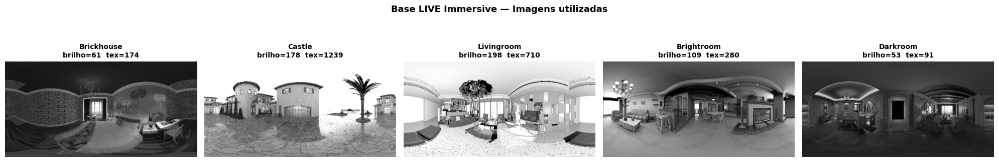

Salvo: grade_imagens.png


In [154]:
import cv2, numpy as np, matplotlib.pyplot as plt

imagens = [
    ('Brickhouse', 'Brickhouse.bmp', 61,  174),
    ('Castle',     'Castle.bmp',     178, 1239),
    ('Livingroom', 'Livingroom.bmp', 198, 710),
    ('Brightroom', 'Brightroom.bmp', 109, 280),
    ('Darkroom',   'Darkroom.bmp',   53,  91),
]

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i, (nome, path, brilho, textura) in enumerate(imagens):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (512, 256))
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(
        f'{nome}\nbrilho={brilho}  tex={textura}',
        fontsize=10, fontweight='bold')
    axes[i].axis('off')

plt.suptitle('Base LIVE Immersive — Imagens utilizadas',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('grade_imagens.png', dpi=150,
            bbox_inches='tight')
plt.show()
print("Salvo: grade_imagens.png")

In [2]:
import cv2
import numpy as np
IMAGE_PATH = '/content/foto Manual.jpeg'
# Carrega as duas fotos em escala de cinza
auto   = cv2.imread('/content/foto Automatica.jpeg', cv2.IMREAD_GRAYSCALE).astype(float)
manual = cv2.imread('/content/foto Manual.jpeg',    cv2.IMREAD_GRAYSCALE).astype(float)

# Redimensiona para o mesmo tamanho se necessário
if auto.shape != manual.shape:
    manual = cv2.resize(manual, (auto.shape[1], auto.shape[0]))

# Resíduo R = Manual - Auto (Manual como "teste", Auto como "referência")
R = manual - auto

# Métricas do resíduo
sigma_Y   = np.std(R)
variancia = np.var(R)
media_R   = np.mean(R)

# SNR = potência do sinal / potência do ruído
sinal    = np.mean(auto**2)
snr      = 10 * np.log10(sinal / variancia) if variancia > 0 else float('inf')

print(f"Média do resíduo  : {media_R:.4f}")
print(f"σY (std resíduo)  : {sigma_Y:.4f}")
print(f"Variância resíduo : {variancia:.4f}")
print(f"SNR               : {snr:.2f} dB")

Média do resíduo  : 28.1720
σY (std resíduo)  : 61.8484
Variância resíduo : 3825.2259
SNR               : 2.96 dB


In [3]:
print(f"SNR : {snr:.2f} dB")

SNR : 2.96 dB
